# Session 6: Environmental Modeling using Remote Sensing



# 1 Data Preparation
In this section, we will introduce the methods for importing and visualizing our data.

[GDAL](https://gdal.org/) - the Geospatial Data Abstraction Library is a software library for reading and writing raster and vector geospatial data formats and forms the basis of most software for processing geospatial data.

There are many formats for using GDAL ranging from graphical tools like ArcGIS or QGIS to command line GDAL tools but here we're using the fantastic `rasterio` python package which provides a pythonic wrapping around GDAL. Basically it reads and writes geospatial formats and provides a Python API based on `numpy` n-dimensional arrays and GeoJSON.

[Rasterio](https://mapbox.github.io/rasterio/) is a highly useful module for raster processing which you can use for reading and writing [several different raster formats](http://www.gdal.org/formats_list.html) in Python. Rasterio is based on [GDAL](http://www.gdal.org/) and Python automatically registers all known GDAL drivers for reading supported formats when importing the module. Most common file formats include for example [TIFF and GeoTIFF](http://www.gdal.org/frmt_gtiff.html), [ASCII Grid](http://www.gdal.org/frmt_various.html#AAIGrid) and [Erdas Imagine .img](http://www.gdal.org/frmt_hfa.html) -files.

## 1.1 Open an image

When we open an image in rasterio we create a Dataset object. As the name would suggest, we can open an image with the "open" function within `rasterio`.

We will use an example image provided in the asset for this section. This image is a subset of a [Landsat 7](https://eospso.gsfc.nasa.gov/missions/landsat-7) image containing the 8 bands on this sensor rearranged in order of wavelength (e.g., Landsat 7's second SWIR channel comes before thermal channel in our stack). The last band in this image is a cloud and cloud shadow mask from Fmask.

In [1]:
# Install the required packages
!pip install rasterio numpy

In [2]:
import rasterio
import numpy as np

# Open the file:
raster = rasterio.open("./data/show_image/LE70220491999322EDC01_stack.tif")

# Check type of the variable 'raster'
type(raster)

rasterio.io.DatasetReader

If your output is `rasterio._io.RasterReader`, congratulations, this means we have successfully opened the file for reading.


## 1.2 Read raster file properties

We need to understand our data, like the `image projection`,the `image size`, the `number of bands`, the `bounds of the file` , the `no data values` and other relevant information. This information will be helpful when you encounter a real problem.

Here, we demonstrate how to check the `image size` and `number of bands` of your image. You can use the following commands to view the relevant information:

In [3]:
# How many rows and columns?
rows, cols = raster.shape
# How many bands does this image have?
num_bands = raster.count

print('Image size is: {r} rows x {c} columns\n'.format(r=rows, c=cols))
print('Number of bands in image: {n}\n'.format(n=num_bands))

Image size is: 250 rows x 250 columns

Number of bands in image: 8



## 1.3 Band statistics
The rasterio Dataset object we created contains a lot of useful information but it is not directly used to read in the raster image. Instead we will need to access the raster's bands using the `read()` method:

In [4]:
# Read the raster band as separate variable
band1 = raster.read(1)

# Check type of the variable 'band'
print(type(band1))

# Data type of the values
print(band1.dtype)

<class 'numpy.ndarray'>
int16


When we load our raster band into memory we will read it into a [NumPy](http://www.numpy.org/) 2-dimensional array. NumPy is, "the fundamental package for scientific computing with Python", because it allows us to represent our data in a very memory efficient way.

Now we have the values of the raster band stored in the variable `band1`.

Data type of the band can be interpreted with the help of GDAL documentation on [Pixel data types](https://gdal.org/user/raster_data_model.html#raster-band). Unsigned integer is always equal or greater than zero and signed integer can store also negative values. For example, an unsigned 16-bit integer can store 2^16 (=65,536) values ranging from 0 to 65,535.

Next, let’s have a look at the values that are stored in the band. As the values of the bands are stored as numpy arrays, it is extremely easy to calculate basic statistics by using basic numpy functions.

In [5]:
# Read all bands
image = raster.read()

# Calculate statistics for each band
stats = []
for band in image:
    stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'max': band.max()})

# Show stats for each channel
stats

[{'min': 198, 'mean': 439.015984, 'median': 414.0, 'max': 1810},
 {'min': 315, 'mean': 661.54288, 'median': 632.0, 'max': 2294},
 {'min': 160, 'mean': 589.379808, 'median': 533.0, 'max': 2820},
 {'min': 1105, 'mean': 3442.297712, 'median': 3441.0, 'max': 5138},
 {'min': 353, 'mean': 2181.928672, 'median': 2170.0, 'max': 4548},
 {'min': 145, 'mean': 1049.99384, 'median': 992.0, 'max': 3705},
 {'min': 2335, 'mean': 2678.677184, 'median': 2637.0, 'max': 3546},
 {'min': 0, 'mean': 0.0, 'median': 0.0, 'max': 0}]

## 1.4 Visualize data

Of course, it is always highly useful to take a look how the data looks like. This is easy with the `plot.show()` -function that comes with rasterio. This can be used to plot a single channel of the data or using mutiple channels simultaniously (multiband). The channels for the data used in here and their corresponding wavelengths are:

1. Blue (0.45 - 0.515)
2. Green (0.525 - 0.605)
3. Red (0.63 - 0.69)
4. NIR (0.75 - 0.90)
5. IR (1.55 - 1.75)

First, let's compare the images from different bands.

In [6]:
# Install the required packages
!pip install matplotlib

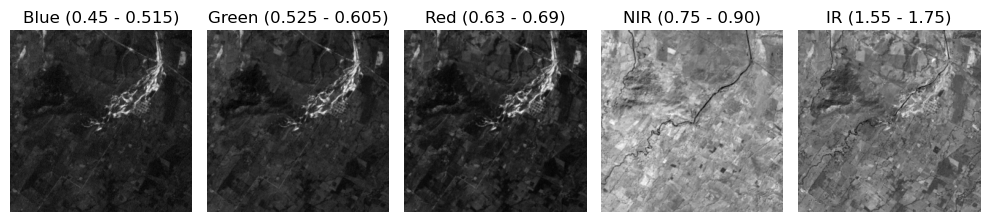

In [7]:
import rasterio
import matplotlib.pyplot as plt

# Create a figure and set the grid size of the subplots
fig, axes = plt.subplots(1, 5, figsize=(10, 5))
axes = axes.flatten() 
band_names = [
    "Blue (0.45 - 0.515)",
    "Green (0.525 - 0.605)",
    "Red (0.63 - 0.69)",
    "NIR (0.75 - 0.90)",
    "IR (1.55 - 1.75)"
]
# Iterate through each band and plot
for i in range(5):
    band = raster.read(i + 1)  #Reading bands (rasterio's band index starts from 1)
    ax = axes[i]
    ax.imshow(band, cmap='gray')
    ax.set_title(band_names[i])
    ax.axis('off')  # Turn off axis display

plt.tight_layout()
plt.show()

Next let’s see how we can plot our input raster image as a normal RGB image.

We need to read the bands into numpy arrays and normalize the cell values to a scale from 0.0 to 1.0:

In [8]:
# Read the grid values into numpy arrays
red = raster.read(3)
green = raster.read(2)
blue = raster.read(1)

# Function to normalize the grid values
def normalize(array):
    """Normalizes numpy arrays into scale 0.0 - 1.0"""
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))

# Normalize the bands
redn = normalize(red)
greenn = normalize(green)
bluen = normalize(blue)

print("Normalized bands")
print(redn.min(), '-', redn.max(), 'mean:', redn.mean())
print(greenn.min(), '-', greenn.max(), 'mean:', greenn.mean())
print(bluen.min(), '-', bluen.max(), 'mean:', bluen.mean())

Normalized bands
0.0 - 1.0 mean: 0.1614209804511278
0.0 - 1.0 mean: 0.1751100960080849
0.0 - 1.0 mean: 0.1495136377171216


As the statistics show, now the arrays have been normalized into scale from 0 to 1.

we can then stack the values from different values together to produce the RGB true color composite. For this we can use Numpy’s [dstack()](https://docs.scipy.org/doc/numpy-1.15.1/reference/generated/numpy.dstack.html) -function:

In [9]:
# Install the required packages
!pip install numpy

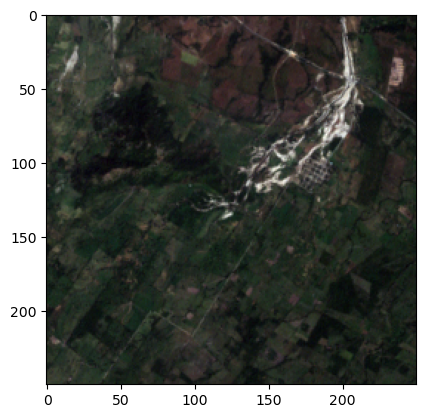

In [10]:
import numpy as np
# Create RGB natural color composite
rgb = np.dstack((redn, greenn, bluen))

# Let's see how our color composite looks like
plt.imshow(rgb)

Here we go, now we have a typical RGB natural color composite image that looks like a photograph taken with the satellite.

Finally we can plot rhe histogram of the raster data

Typically when working with raster data, you want to look at the histogram of different bands in your data. You can simply call `plt.hist()` function

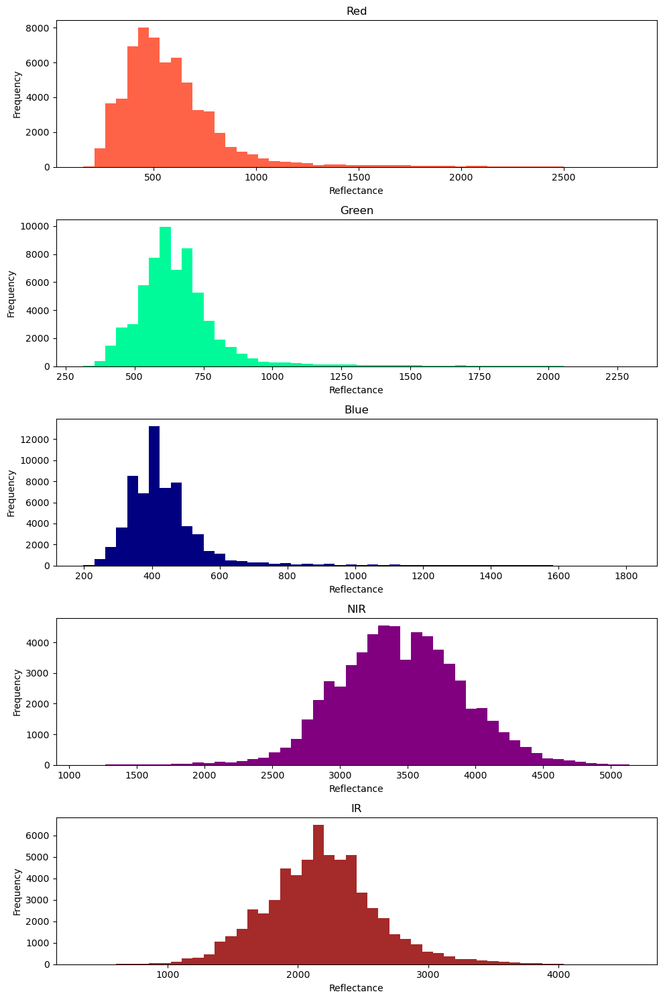

In [11]:
nir = raster.read(4)
ir = raster.read(5)

nbins = 50

fig, axs = plt.subplots(5, 1, figsize=(10, 15))

axs[0].hist(red.ravel(), color="tomato", bins=nbins)
axs[0].set_xlabel("Reflectance")
axs[0].set_ylabel("Frequency")
axs[0].set_title("Red")

axs[1].hist(green.ravel(), color="MediumSpringGreen", bins=nbins)
axs[1].set_xlabel("Reflectance")
axs[1].set_ylabel("Frequency")
axs[1].set_title("Green")

axs[2].hist(blue.ravel(), color="navy", bins=nbins)
axs[2].set_xlabel("Reflectance")
axs[2].set_ylabel("Frequency")
axs[2].set_title("Blue")

axs[3].hist(nir.ravel(), color="purple", bins=nbins)
axs[3].set_xlabel("Reflectance")
axs[3].set_ylabel("Frequency")
axs[3].set_title("NIR")

axs[4].hist(ir.ravel(), color="brown", bins=nbins)
axs[4].set_xlabel("Reflectance")
axs[4].set_ylabel("Frequency")
axs[4].set_title("IR")

plt.tight_layout()
plt.show()

# 2 NDVI and NDWI
In this section, we will introduce the calculation methods for two common indices: Normalized Difference Vegetation Index (NDVI) and Normalized Difference Water Index (NDWI). NDVI is primarily used for vegetation extraction in remote sensing images, while NDWI is mainly used for water extraction.

We will demonstrate the method for calculating NDVI, and then you will calculate NDWI as an exercise.

## 2.1 NDVI
NDVI is a commonly used vegetation index that measures the coverage of surface vegetation. It is calculated using the reflectance values from the near-infrared and red bands.

The NDVI is calculated using the formula:

$$
\text{NDVI} = \frac{(\text{NIR} - \text{Red})}{(\text{NIR} + \text{Red})}
$$

where:
- **NIR** is the reflectance in the near-infrared band.
- **Red** is the reflectance in the red band.

NDVI values range from -1 to 1, with higher values indicating healthier vegetation.

In this demonstration, We have provided two sets of band data from 2014 and 2019, each containing the red band (B4) and the near-infrared band (B5). After completing the NDVI calculation, we will also demonstrate a practical use of NDVI: `calculating the change in vegetation coverage`.

### 2.1.1 Setting up the input files

In [12]:
#Image-2019
path_B5_2019="./data/NDVI/20190203/B5.TIF"
path_B4_2019="./data/NDVI/20190203/B4.TIF"

#Image-2014
path_B5_2014="./data/NDVI/20140205/B5.TIF"
path_B4_2014="./data/NDVI/20140205/B4.TIF"

### 2.1.2 Open the Landsat image bands with rasterio
In this part we open the red (Band 4) and near infrared NIR (Band 5) with rasterio and then we read the images as matrix arrays with float numbers of 32 bits.

In [13]:
#Check bands
B5_2019 = rasterio.open(path_B5_2019)
B5_2019.read(1)

array([[    0, 15510, 14779, ..., 18204, 18722, 18515],
       [    0, 11765, 13832, ..., 15842, 16966, 17672],
       [    0, 10027, 11470, ..., 14321, 14948, 15572],
       ...,
       [    0, 14584, 13352, ..., 15260, 14624, 13359],
       [    0, 14569, 13616, ..., 15065, 13242, 11065],
       [    0,     0,     0, ...,     0,     0,     0]], dtype=uint16)

In [14]:
#Open raster bands
B5_2019 = rasterio.open(path_B5_2019)
B4_2019 = rasterio.open(path_B4_2019)
B5_2014 = rasterio.open(path_B5_2014)
B4_2014 = rasterio.open(path_B4_2014)

#Read bands as matrix arrays
B52019_Data = B5_2019.read(1)
B42019_Data = B4_2019.read(1)
B52014_Data = B5_2014.read(1)
B42014_Data = B4_2014.read(1)

### 2.1.4 Compute the NDVI and store them as a different file
We can compute the NDVI as a matrix algebra with some Numpy functions.

In [15]:
ndvi2014 = np.divide(B52014_Data - B42014_Data, B52014_Data + B42014_Data,where=(B52014_Data + B42014_Data)!=0)
ndvi2014[ndvi2014 > 1] = 1 

ndvi2019 = np.divide(B52019_Data - B42019_Data, B52019_Data+ B42019_Data,where=(B52019_Data + B42019_Data)!=0)
ndvi2019[ndvi2019 > 1] = 1

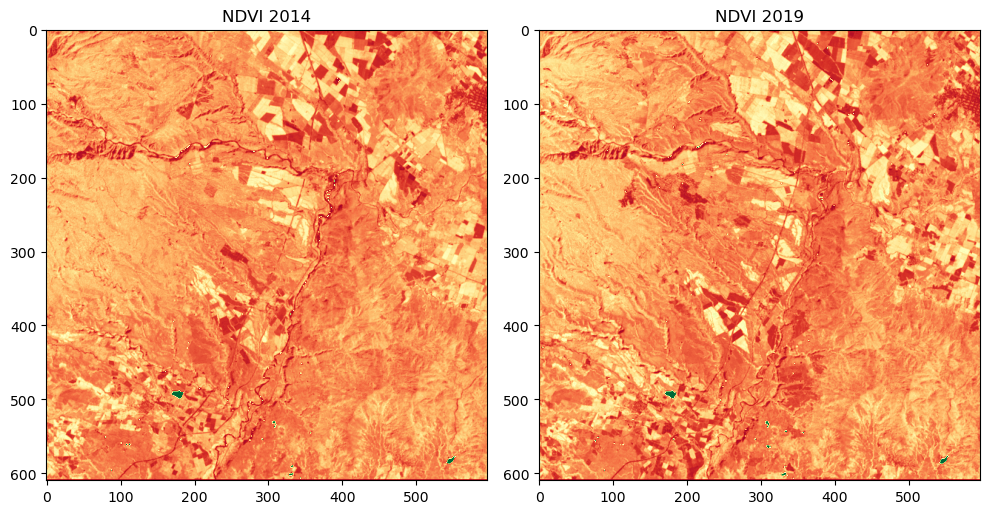

In [16]:
#plot the array
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(ndvi2014, cmap='RdYlGn')
axes[0].set_title('NDVI 2014')

axes[1].imshow(ndvi2019, cmap='RdYlGn')
axes[1].set_title('NDVI 2019')

plt.tight_layout()
plt.show()

## 2.1.5 Create a land cover change image

We create a land cover change image based on the differences in NDVI from 2019 and 2014 imagery.

In [17]:
ndviChange = ndvi2019-ndvi2014
ndviChange = np.where((ndvi2014>-999) & (ndvi2019>-999),ndviChange,-999)
ndviChange

array([[ 0.        ,  0.03547079,  0.03795126, ...,  0.03159038,
         0.03800274,  0.02669263],
       [ 0.        ,  0.03765402,  0.05892348, ..., -0.00586917,
         0.01892243,  0.0195063 ],
       [ 0.        ,  0.03218401,  0.03739506, ..., -0.06377307,
        -0.0306757 ,  0.03894268],
       ...,
       [ 0.        , -0.01659706,  0.01140219, ...,  0.00272184,
         0.02552676,  0.06663901],
       [ 0.        ,  0.00599447, -0.00407705, ...,  0.05750174,
         0.00467577,  0.08448431],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

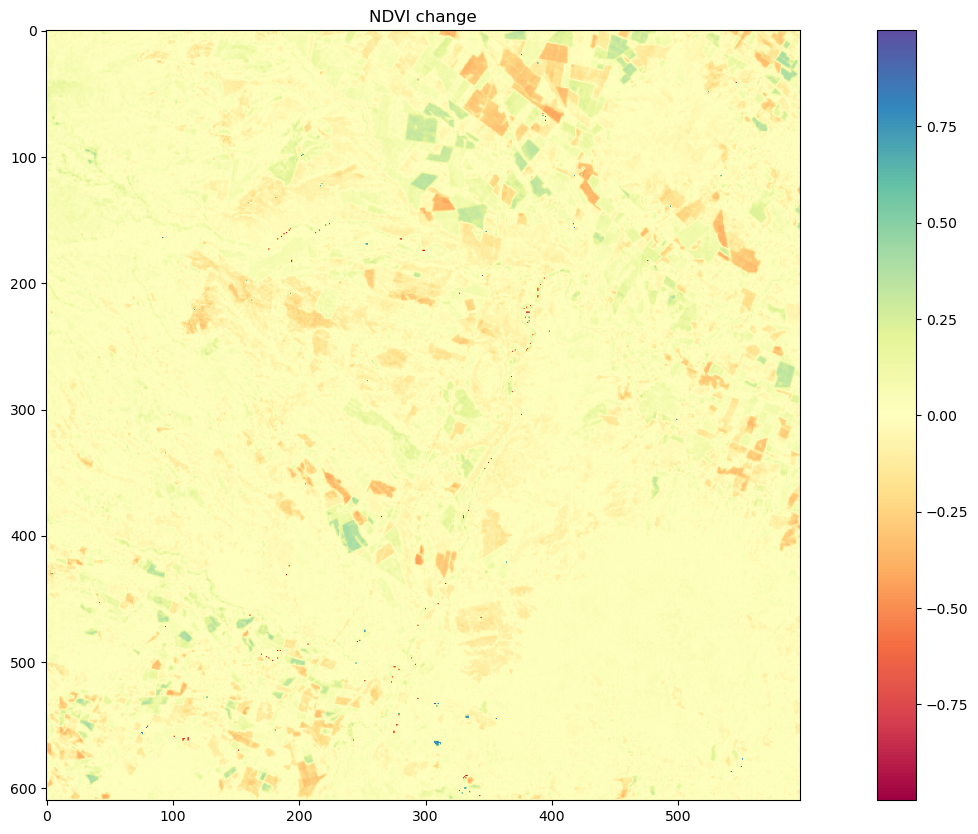

In [18]:
plt.figure(figsize=(20, 10))
plt.imshow(ndviChange, cmap='Spectral')
plt.title('NDVI change')
plt.colorbar()  
plt.show()

## 2.2 NDWI

### 2.2.1 (Group work) Calculate NDWI

The Normalized Difference Water Index (NDWI) is a widely used remote sensing index for identifying and monitoring water bodies. NDWI is calculated using the reflectance of the near-infrared (NIR) and green bands. The formula is as follows:

$$
\text{NDWI} = \frac{(\text{Green} - \text{NIR})}{(\text{Green} + \text{NIR})}
$$

### Parameters:
- **Green**: Reflectance in the green band, where water bodies have a strong reflection.
- **NIR**: Reflectance in the near-infrared band, where water bodies have strong absorption.

### Interpretation:
- NDWI values range from -1 to 1.
- High NDWI values (close to 1) typically indicate the presence of water bodies.
- Low NDWI values (close to 0 or negative) indicate land or vegetation.

---

Now it's your turn. You need to calculate NDWI through group collaboration. We have provided two sets of band data from 2017 and 2020, each containing the green band (B3) and the near-infrared band (B5). These datasets correspond to the period before and during a flood. Similar to the NDVI task, you will need to calculate NDWI to complete a practical task: `determining the extent of the flood impact.`

### Code Example

In [19]:
#Image-2020
path_B3_2020="./data/NDWI/20200127/B3.TIFF"
path_B5_2020="./data/NDWI/20200127/B5.TIFF"

#Image-2017
path_B3_2017="./data/NDWI/20170118/B3.TIFF"
path_B5_2017="./data/NDWI/20170118/B5.TIFF"

#Open raster bands
B5_2020 = rasterio.open(path_B5_2020)
B3_2020 = rasterio.open(path_B3_2020)
B5_2017 = rasterio.open(path_B5_2017)
B3_2017 = rasterio.open(path_B3_2017)

#Read bands as matrix arrays
B52020_Data = B5_2020.read(1)
B32020_Data = B3_2020.read(1)
B52017_Data = B5_2017.read(1)
B32017_Data = B3_2017.read(1)

ndwi2017 = np.divide(B32017_Data - B52017_Data, B32017_Data + B52017_Data,where=(B32017_Data + B52017_Data)!=0)
ndwi2017[ndwi2017 > 1] = 1 #for water bodies

ndwi2020 = np.divide(B32020_Data - B52020_Data, B32020_Data+ B52020_Data,where=(B32020_Data + B52020_Data)!=0)
ndwi2020[ndwi2020 > 1] = 1

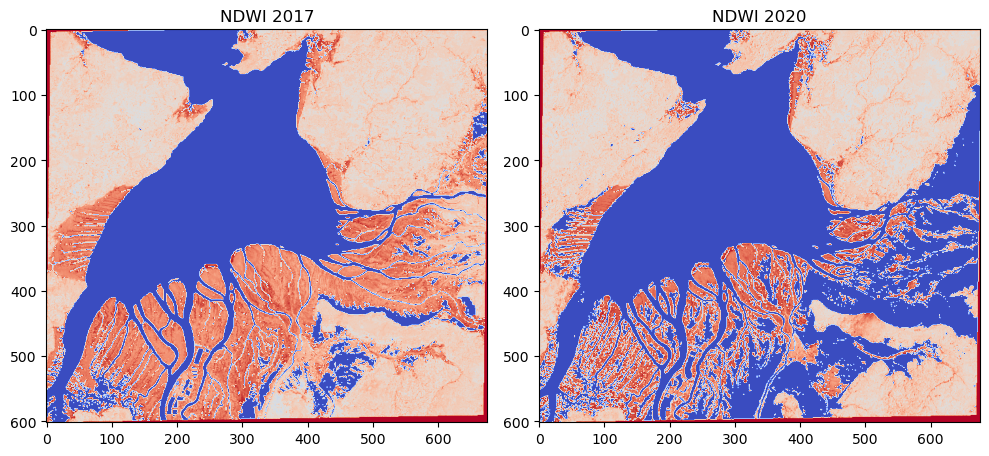

In [20]:
#plot the array
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(ndwi2017, cmap='coolwarm_r', vmin=0, vmax=1)
axes[0].set_title('NDWI 2017')

axes[1].imshow(ndwi2020, cmap='coolwarm_r', vmin=0, vmax=1)
axes[1].set_title('NDWI 2020')

plt.tight_layout()
plt.show()

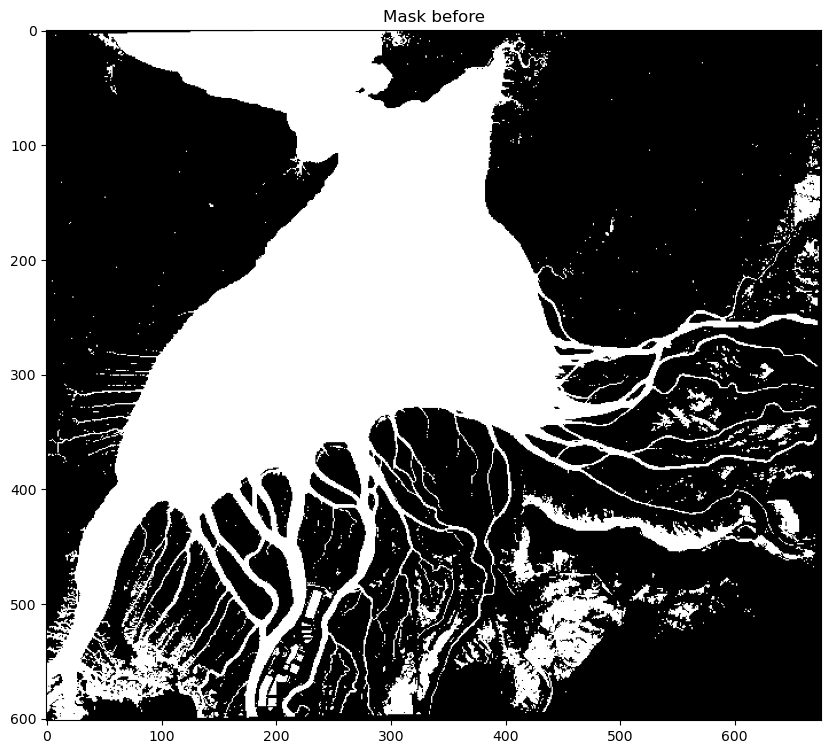

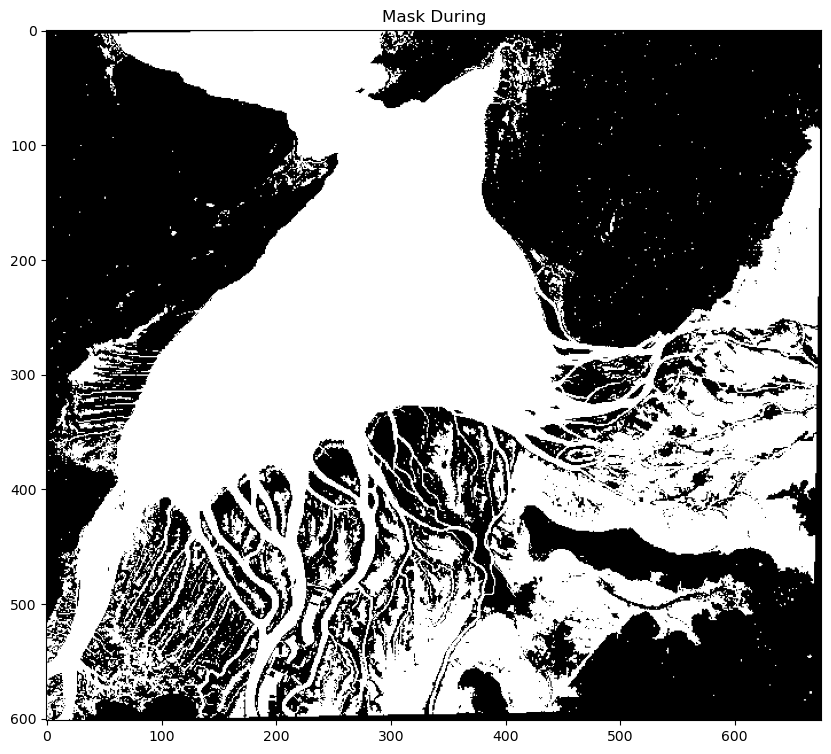

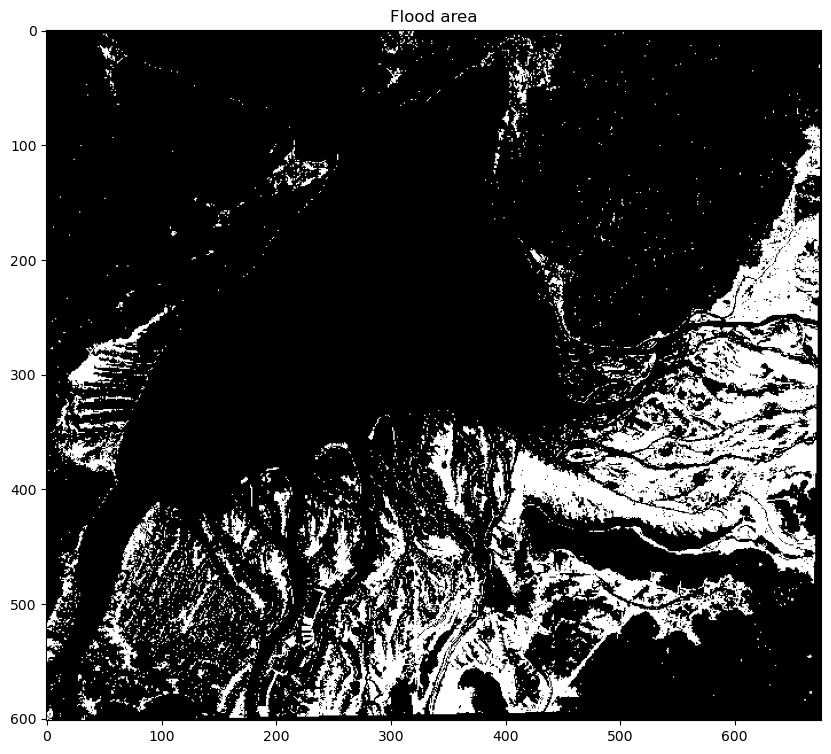

In [21]:
# ndwiChange = ndwi2020-ndwi2017
# ndwiChange = np.where((ndwi2017>-999) & (ndwi2020>-999),ndwiChange,-999)
# plt.figure(figsize=(20, 10))
# plt.imshow(ndwiChange, cmap='Spectral')
# plt.title('NDWI change')
# plt.colorbar()  
# plt.show()

mask_bef = (ndwi2017 > 0.6).astype(int)
plt.figure(figsize=(10, 10))
plt.imshow(mask_bef, cmap='Greys_r')
plt.title('Mask before')
plt.show()

mask_dur = (ndwi2020 > 0.6).astype(int)
plt.figure(figsize=(10, 10))
plt.imshow(mask_dur, cmap='Greys_r')
plt.title('Mask During')
plt.show()

flood_area = (mask_dur - mask_bef)
flood_area = np.where(flood_area <0, 0, flood_area)
plt.figure(figsize=(10, 10))
plt.title('Flood area')
plt.imshow(flood_area, cmap='Greys_r')


### 2.2.2 (Group work) Discussion
    1.Are NDVI and NDWI robust enough to be suitable for all types of research areas?
    2.Which factors can influence the calculation of NDVI and NDWI?
    3.Please describe some other practical applications of NDVI and NDWI.

# 3 Machine Learning for Land Cover Classification

In this section we will demonstrate how machine learning methods could be applied to land cover classification from satellite imagery.

This section will use two simple machine learning models (Support Vector Machine and Multi-layer Perceptron) within scikit-learn python library (https://scikit-learn.org).

Towards the end of this section, you are encouraged to achieve the same objective using other Machine Learning Model (We suggest Random Forest)

## 3.1 Import modules

In this step, we will import the needed modules. We will use the Scikit-learn package for machine learning

Scikit-learn is a free software machine learning library for Python. It features various classification, regression and clustering algorithms including support vector machines, random forests, gradient boosting, k-means and DBSCAN, and is designed to interoperate with the Python numerical and scientific libraries NumPy and SciPy. 


In this notebook you will learn how to use the Support Vector Machine (SVM) and Multi-layer Perceptron (MLP) implemented in scikit-learn.

In [22]:
from glob import glob

from sklearn.preprocessing import StandardScaler

from scipy.io import loadmat
from sklearn.metrics import classification_report, accuracy_score

from matplotlib.colors import ListedColormap

## 3.2 Read data

The data information used in this section is shown below

---

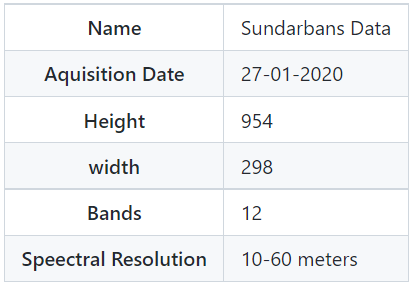

First, we need to use the built-in Python module `glob` to obtain the paths of all bands of the remote sensing imagery and sort these paths using the `sort()` method. Next, we utilize the `np.stack` function to stack all the bands together into a three-dimensional array. Finally, we can examine the basic information of the array, including its `height`, `width`, and the `number of bands`.

In [23]:
S_sentinel_bands = glob("./data/ML/sundarbans_data/*B?*.tiff")
S_sentinel_bands.sort()
S_sentinel_bands

['./data/ML/sundarbans_data\\B01.tiff',
 './data/ML/sundarbans_data\\B02.tiff',
 './data/ML/sundarbans_data\\B03.tiff',
 './data/ML/sundarbans_data\\B04.tiff',
 './data/ML/sundarbans_data\\B05.tiff',
 './data/ML/sundarbans_data\\B06.tiff',
 './data/ML/sundarbans_data\\B07.tiff',
 './data/ML/sundarbans_data\\B08.tiff',
 './data/ML/sundarbans_data\\B09.tiff',
 './data/ML/sundarbans_data\\B10.tiff',
 './data/ML/sundarbans_data\\B11.tiff',
 './data/ML/sundarbans_data\\B12.tiff']

In [24]:
l = []
for i in S_sentinel_bands:
  with rasterio.open(i, 'r') as f:
    l.append(f.read(1))
# join bands (a sequence of arrays) together as a stack
arr_st = np.stack(l)
# print basic information (height, width, bands)
print(f'Height: {arr_st.shape[1]}\nWidth: {arr_st.shape[2]}\nBands: {arr_st.shape[0]}')

Height: 954
Width: 298
Bands: 12


## 3.3 Visualize Data

Next, let's take a look at the images we are going to process. We will examine the individual band images as well as the RGB composite image.

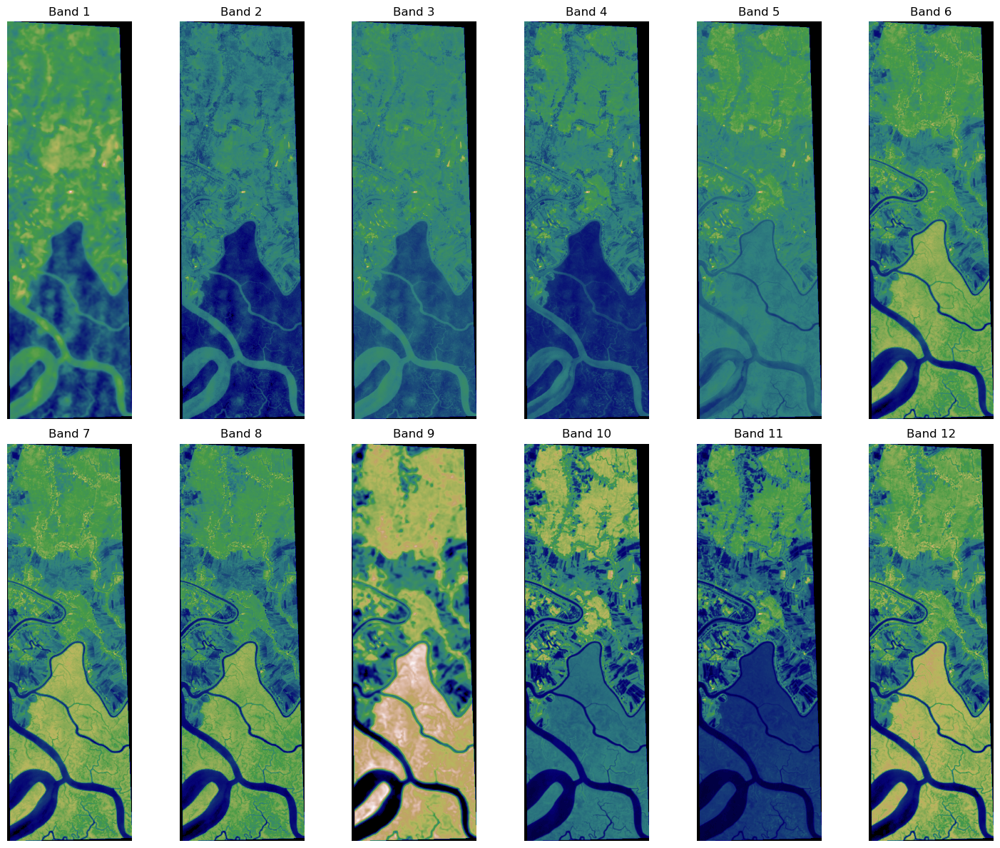

In [25]:

    fig, axes = plt.subplots(2, 6, figsize=(15, 12))  
    axes = axes.flatten()  
    
    for i in range(12):
        band = arr_st[i] 
        ax = axes[i]
        ax.imshow(band, cmap='gist_earth')
        ax.set_title(f'Band {i + 1}')
        ax.axis('off')  

    plt.tight_layout()
    plt.show()

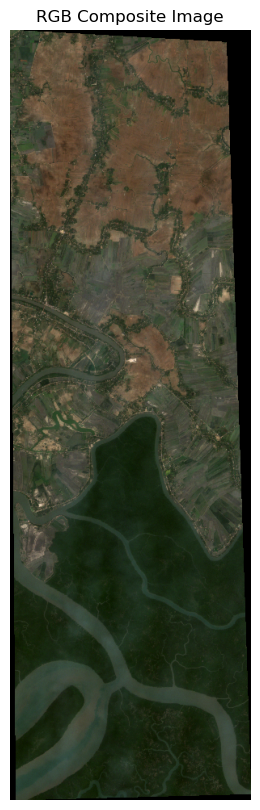

In [26]:
rgb_image = np.dstack((arr_st[3], arr_st[2], arr_st[1]))
rgb_image = rgb_image / rgb_image.max()

plt.figure(figsize=(8, 10))
plt.imshow(rgb_image)
plt.title('RGB Composite Image')
plt.axis('off') 
plt.show()

## 3.4 Preprocessing
Before training the classifier, we need to prepare the groundtruth for the classifier to learn, and we also need to pre-process the data within scikit-learn.

### 3.4.1 Data & Groundtruth Pre-processing

One of the most common ways to preprocessing/scale data is to ensure the data has zero mean and unit variance after scaling (also known as standardisation or sometimes z-scoring), which is implemented in the `StandardScaler (scikit-learn)`.

The main idea is to normalise/standardise i.e. μ = 0 and σ = 1 your features/variables/columns of x, individually, before applying any machine learning model.

In [27]:
x = np.moveaxis(arr_st, 0, -1)
x.shape

(954, 298, 12)

**Scaler.fit()**

Similar to fitting a model, we can fit our scaling to the data using the fit method. This simply estimates mean and standard deviation. You could think of scaling as a very simple unsupervised learning procedure, which certainly doesn’t require the target y, so it is enough to pass our feature X_data to the fit method.


In [28]:
from sklearn.preprocessing import StandardScaler

X_data = x.reshape(-1, 12)

scaler = StandardScaler().fit(X_data)
# Now, scaler has stored the mean and standard deviation of our data

# To apply the scaling, we can use the transform method (subtract the mean and divide by the standard deviation)
X_scaled = scaler.transform(X_data)

X_scaled.shape

(284292, 12)

In [29]:
# read groundtruth data (mat format)
y_data = loadmat('./data/ML/sundarbans_data/Sundarbands_gt.mat')['gt']
y_data.shape

(954, 298)

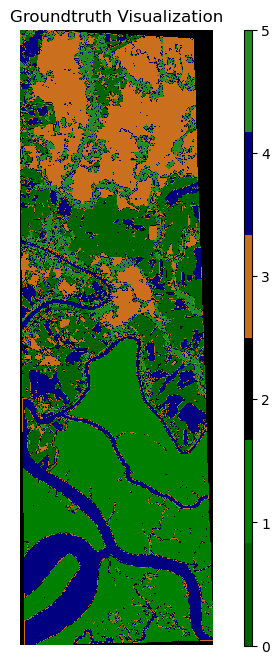

In [30]:
# Visualise Groundtruth

cmap = ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen'])

plt.figure(figsize=(8, 8))
plt.imshow(y_data, cmap=cmap)
plt.colorbar(aspect=80)  
plt.title('Groundtruth Visualization')
plt.axis('off')  
plt.show()

### 3.4.2 Train Test Split


Split the groundtruth into a training and a testing set. We call the train_test_split function within scikit-learn

The split shown here is 70% training and 30% testing datasets, you can also try higher or lower training set ratios to see the difference in terms of classification accuracy

In [31]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_data.ravel(), test_size=0.30, stratify = y_data.ravel())

print(f'X_train Shape: {X_train.shape}\nX_test Shape: {X_test.shape}\ny_train Shape: {y_train.shape}\ny_test Shape:{y_test.shape}')

X_train Shape: (199004, 12)
X_test Shape: (85288, 12)
y_train Shape: (199004,)
y_test Shape:(85288,)


## 3.5 Machine learning classification

### 3.5.1 Support Vector Machine (SVM)

SVM is a supervised learning algorithm used for classification and regression tasks. It works by finding an optimal hyperplane that separates the data into different classes. For non-linear classification problems, kernel functions can be employed to map the data into a higher-dimensional space, making it linearly separable.

**Parameter Explanation:**

- **C:** The regularization parameter controls the smoothness of the decision function. Smaller values of C will result in a smoother decision boundary, while larger values will make the model attempt to classify all training samples correctly.
- **Kernel:** The type of kernel function used to map the data into a higher-dimensional space. Common kernel functions include 'linear', 'poly' (polynomial), and 'rbf' (radial basis function).
- **Degree:** The degree of the polynomial kernel function, which is only applicable when using the 'poly' kernel.
- **Cache_size:** Specifies the cache size in MB for storing the training data during the model training process.


In [32]:
from sklearn.svm import SVC

svm = SVC(C=3.0, kernel='rbf', degree=6, cache_size=1024)
svm.fit(X_train, y_train)

SVC(C=3.0, cache_size=1024, degree=6)

In [33]:
svm_pred = svm.predict(X_test)

In [34]:
print(f"Accuracy: {accuracy_score(y_test, svm_pred)*100}")
print('---')
print(classification_report(y_test, svm_pred))

Accuracy: 99.88392270893912
---
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     16222
           1       1.00      1.00      1.00     23570
           2       1.00      1.00      1.00      6095
           3       1.00      1.00      1.00     16790
           4       1.00      1.00      1.00     13545
           5       1.00      1.00      1.00      9066

    accuracy                           1.00     85288
   macro avg       1.00      1.00      1.00     85288
weighted avg       1.00      1.00      1.00     85288



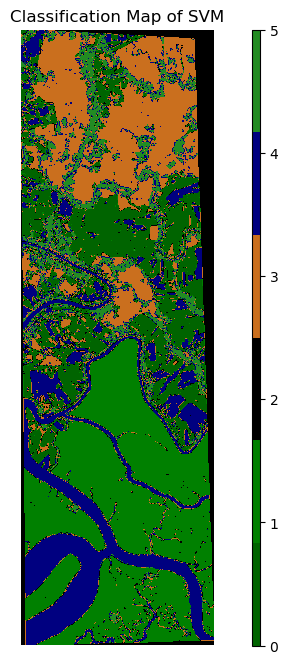

In [35]:
svm_classification_map = svm.predict(X_scaled).reshape((954, 298))

cmap = ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen'])

plt.figure(figsize=(10, 8))
plt.imshow(svm_classification_map, cmap=cmap)
plt.colorbar(aspect=80) 
plt.title('Classification Map of SVM')
plt.axis('off')  
plt.show()

### 3.5.2 Multi-layer Perceptron (MLP)

**Multi-layer Perceptron (MLP) Classifier:**

MLP is a type of artificial neural network used for classification tasks. It consists of an input layer, one or more hidden layers, and an output layer. Each layer is composed of nodes (neurons) that are fully connected to the nodes in the subsequent layer. The MLP classifier works by passing input data through the network, applying weights and biases, and using an activation function to produce the output.

**Parameter Explanation:**

- **Solver:** The optimization algorithm used for training the MLP. Common solvers include 'lbfgs', 'sgd' (Stochastic Gradient Descent), and 'adam'.
- **Activation:** The activation function applied to the output of each neuron. Common activation functions include 'identity', 'logistic', 'tanh', and 'relu' (Rectified Linear Unit).
- **Alpha:** The regularization parameter (L2 penalty) that helps prevent overfitting by penalizing large weights.
- **Hidden_layer_sizes:** The number and size of the hidden layers in the network. For example, (50, 50) indicates two hidden layers, each with 50 neurons.
- **Random_state:** A seed value for the random number generator to ensure reproducibility of results.
- **Max_iter:** The maximum number of iterations during training.
- **Verbose:** The verbosity level; if set to a positive integer, it prints progress messages during training.
- **Learning_rate_init:** The initial learning rate for weight updates.


In [36]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(solver='sgd', activation='relu',alpha=1e-4,hidden_layer_sizes=(50,50), random_state=1,max_iter=10,verbose=10,learning_rate_init=.1)

mlp.fit(X_train, y_train)

Iteration 1, loss = 0.03941627
Iteration 2, loss = 0.01857382
Iteration 3, loss = 0.01564563
Iteration 4, loss = 0.01456952
Iteration 5, loss = 0.01268430
Iteration 6, loss = 0.01333372
Iteration 7, loss = 0.01133055
Iteration 8, loss = 0.01092857
Iteration 9, loss = 0.01086286
Iteration 10, loss = 0.01134733


MLPClassifier(hidden_layer_sizes=(50, 50), learning_rate_init=0.1, max_iter=10,
              random_state=1, solver='sgd', verbose=10)

In [37]:
mlp_pred = mlp.predict(X_test)

In [38]:
print(f"Accuracy: {accuracy_score(y_test, mlp_pred)*100}")
print('---')
print(classification_report(y_test, mlp_pred))

Accuracy: 99.54976081043054
---
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     16222
           1       1.00      1.00      1.00     23570
           2       1.00      1.00      1.00      6095
           3       1.00      1.00      1.00     16790
           4       1.00      0.99      0.99     13545
           5       0.98      0.99      0.99      9066

    accuracy                           1.00     85288
   macro avg       0.99      1.00      1.00     85288
weighted avg       1.00      1.00      1.00     85288



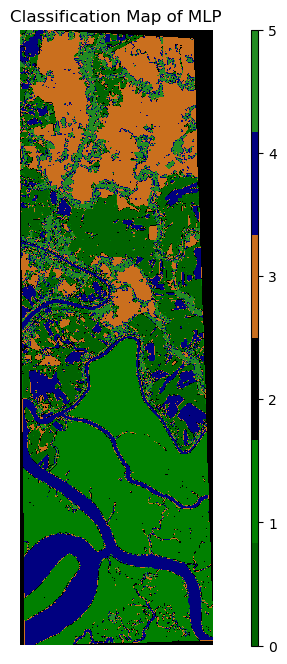

In [39]:
mlp_classification_map = mlp.predict(X_scaled).reshape((954, 298))

cmap = ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen'])

plt.figure(figsize=(10, 8))
plt.imshow(mlp_classification_map, cmap=cmap)
plt.colorbar(aspect=80) 
plt.title('Classification Map of MLP')
plt.axis('off')  
plt.show()

## 3.6 (Group work) Land Cover Classification Using Random Forest
Now you have seen SVM and MLP classifiers and their results, it's time for you to explore other machine learning algorithms on our data and practice.Please try to use `Random Forest (RF)` for classification.

### 3.6.1 (Group work) Random Forest

Random Forest is an ensemble learning algorithm used for classification and regression tasks. It constructs multiple decision trees during training and outputs the mode of the classes (classification) or the mean prediction (regression) of the individual trees. Random Forest leverages the power of multiple models to improve accuracy and robustness compared to a single decision tree.

**Parameter Explanation:**

- **n_estimators:** The number of trees in the forest. Increasing the number of trees can improve performance but also increases computational cost.
- **Criterion:** The function used to measure the quality of a split. Common options include 'gini' for the Gini impurity and 'entropy' for information gain.
- **max_features:** The number of features to consider when looking for the best split. Options include 'auto', 'sqrt', and 'log2'.
- **max_depth:** The maximum depth of the tree. Limiting the depth can prevent overfitting.
- **min_samples_split:** The minimum number of samples required to split an internal node.
- **min_samples_leaf:** The minimum number of samples required to be at a leaf node.
- **bootstrap:** Whether bootstrap samples are used when building trees. If False, the whole dataset is used to build each tree.
- **random_state:** A seed used by the random number generator to ensure reproducibility of results.




You can watch the [scikit-learn guidebook](https:scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) to find the random forest package using example

### Code Example

In [40]:
#import random forest package
from sklearn.ensemble import RandomForestClassifier
#create the random forest classifier
rf = RandomForestClassifier(random_state=0)
#traing the classifier with X_train and y_train
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

In [41]:
# do the prediction with X_test 
rf_pred = rf.predict(X_test)


In [42]:
#export Accuracy with y_test 
print(f"Accuracy: {accuracy_score(y_test, rf_pred)*100}")

print('---')
# show the report table
print(classification_report(y_test, rf_pred))

Accuracy: 98.95647687834162
---
              precision    recall  f1-score   support

           0       0.98      0.99      0.98     16222
           1       1.00      1.00      1.00     23570
           2       1.00      1.00      1.00      6095
           3       0.99      0.99      0.99     16790
           4       0.99      0.99      0.99     13545
           5       0.97      0.97      0.97      9066

    accuracy                           0.99     85288
   macro avg       0.99      0.99      0.99     85288
weighted avg       0.99      0.99      0.99     85288



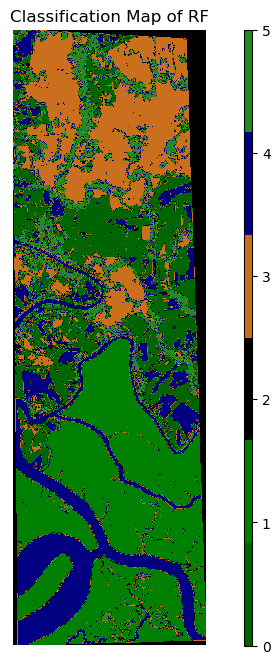

In [43]:
rf_classification_map = rf.predict(X_scaled).reshape((954, 298))

cmap = ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen'])

plt.figure(figsize=(10, 8))
plt.imshow(rf_classification_map, cmap=cmap)
plt.colorbar(aspect=80) 
plt.title('Classification Map of RF')
plt.axis('off')  
plt.show()

### 3.6.2 (Group work) Discussion
    1.Does the model accuracy approaching 1 imply that the model can perfectly solve any land cover classification problem?
    2.What causes the result accuracy to be excessively high?
    3.Is there a perfect model that can be applied to any problem?

# 4 Deep learning in environmental modelling

Currently, deep learning-based methods for remote sensing data processing are gaining increasing attention. In this section, we will introduce deep learning methods in remote sensing using U-Net as an example.

 U-Net is a deep learning method proposed by [Ronneberger et al. (2015)](https://arxiv.org/abs/1505.04597). Initially designed for biomedical imaging, its relevance has grown today across nearly all areas of interest, including remote sensing.

 Typically, training a deep learning model requires extremely high GPU performance and a significant amount of time. Therefore, we will not be retraining a model here. Instead, we will demonstrate the structure of the model. In the subsequent group work, we will provide a pre-trained model and encourage everyone to use this pre-trained model for validation.

## 4.1 Import modules

In this step, we will import the needed modules. We will use the tensorflow package for deep learning

[TensorFlow](https://www.tensorflow.org/) is an open-source deep learning framework developed by Google, widely used for building and training models.

In [44]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from PIL import Image

## 4.2 Build a U-Net model with tensorflow


In [45]:
def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    conv1 = Conv2D(32, (3, 3), activation="relu", padding="same")(inputs)
    conv1 = Conv2D(32, (3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(64, (3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(128, (3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(256, (3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation="relu", padding="same")(pool4)
    conv5 = Conv2D(512, (3, 3), activation="relu", padding="same")(conv5)

    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation="relu", padding="same")(up6)
    conv6 = Conv2D(256, (3, 3), activation="relu", padding="same")(conv6)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation="relu", padding="same")(up7)
    conv7 = Conv2D(128, (3, 3), activation="relu", padding="same")(conv7)

    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation="relu", padding="same")(up8)
    conv8 = Conv2D(64, (3, 3), activation="relu", padding="same")(conv8)

    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation="relu", padding="same")(up9)
    conv9 = Conv2D(32, (3, 3), activation="relu", padding="same")(conv9)
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs=[inputs], outputs=[conv10])
    adam = Adam(learning_rate=0.00005)
    model.compile(optimizer=adam, loss='binary_crossentropy', metrics=['accuracy'])
    return model


model = unet()
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 32  9248        ['conv2d[0][0]']                 
                                )                                                             

## 4.3 (Group work) Water body extraction  with pre-trained model
### Code Example

In [46]:

model_path = './data/DL/unet_final.hdf5'
model = tf.keras.models.load_model(model_path)

In [81]:

image_path = './data/DL/water/India.tif'
with rasterio.open(image_path) as src:
    img_array = src.read([1, 2, 3])  
    img_array = np.transpose(img_array, (1, 2, 0)) 

img_array = tf.image.resize(img_array, (256, 256)).numpy()
img_array = img_to_array(img_array)
print(img_array.shape)

(256, 256, 3)


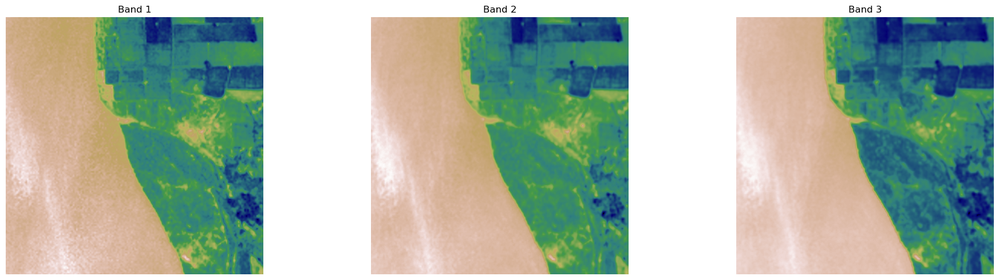

In [93]:
    fig, axes = plt.subplots(1, 3, figsize=(20,5))  
    axes = axes.flatten()  
    
    for i in range(3):
        band = img_array[:, :, i] 
        ax = axes[i]
        ax.imshow(band, cmap='gist_earth')
        ax.set_title(f'Band {i + 1}')
        ax.axis('off')  

    plt.tight_layout()
    plt.show()


In [72]:
img_array_expanded = np.expand_dims(img_array, axis=0)

prediction = model.predict(img_array_expanded)
prediction = (prediction.squeeze() > 0.5).astype(np.uint8) * 255


1/1 [==============================] - 0s 101ms/step


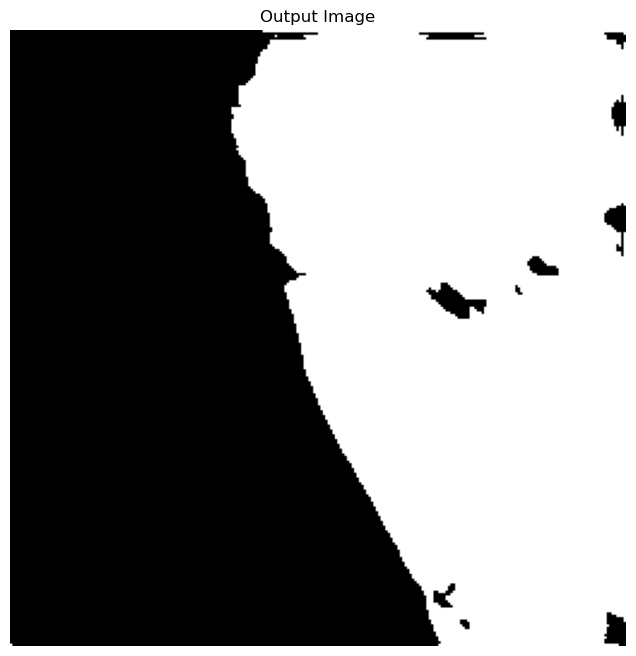

In [75]:
plt.figure(figsize=(10, 8))
plt.imshow(prediction, cmap='gray')
plt.title('Output Image')
plt.axis('off')  
plt.show()

## 4.4 (Group work) Discussion
    1.How do deep learning methods differ from traditional machine learning methods?
    2.What issues do you think need to be considered when training a model with your own samples?